# YOLO vs RF-DETR: Model Comparison Report (Part 2 of 2)

*This report is split into two notebooks for easier viewing on GitHub:*

- **Part 1:** [`yolo_vs_rfdetr_part1.ipynb`](./yolo_vs_rfdetr_part1.ipynb): Sections 1–7: Setup, Data, Quantitative Results, Impact of Dataset Size, Impact of Data Transformations, Training Dynamics, Loss Analysis.
- **Part 2 (this notebook):** Sections 8–11: Qualitative Examples, Per-Class Detection Analysis, Video Analysis, Conclusions.


## Setup

This notebook continues directly from [Part 1](./22_yolo_vs_rfdetr_part1.ipynb). The cell below re-creates the imports, plotting style, constants, and the `runs_data` dictionary (loaded from `models/metadata/`) that the rest of this notebook relies on.

In [52]:
import json
import math
import shutil
import subprocess
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display, Video, Image as IPyImage

plt.rcParams.update({
    "figure.dpi": 130,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.grid": True,
    "grid.alpha": 0.3,
    "grid.linestyle": "--",
    "font.size": 11,
})

YOLO_COLOR   = "#2563eb"
RFDETR_COLOR = "#dc2626"

VARIANT_ORDER = ["base", "base-transformed", "extended", "extended-transformed"]
CLASSES = ["player", "goalkeeper", "referee", "ball"]

pd.set_option("display.float_format", "{:.4f}".format)
pd.set_option("display.max_columns", 20)

META_ROOT = Path("../models/metadata")

RUNS = [
    "rfdetr-base-full-v2",
    "rfdetr-base-transformed-v2",
    "rfdetr-extended-full-v2",
    "rfdetr-extended-transformed-v2",
    "yolo-base-full-v2",
    "yolo-base-transformed-v2",
    "yolo-extended-full-v2",
    "yolo-extended-transformed-v2",
]

OUTPUT_FILENAME = "per_class_metrics.json"


def load_per_class(run_name):
    path = META_ROOT / run_name / OUTPUT_FILENAME
    if not path.exists():
        return None
    with open(path) as f:
        return json.load(f)


def weighted_f1(per_class):
    total = sum(m["support"] for m in per_class.values())
    return sum(m["f1"] * m["support"] for m in per_class.values()) / total if total else 0.0


def weighted_precision(per_class):
    total = sum(m["support"] for m in per_class.values())
    return sum(m["precision"] * m["support"] for m in per_class.values()) / total if total else 0.0


def weighted_recall(per_class):
    total = sum(m["support"] for m in per_class.values())
    return sum(m["recall"] * m["support"] for m in per_class.values()) / total if total else 0.0


def load_run(run_name):
    base = META_ROOT / run_name
    with open(base / "metrics_summary.json") as f:
        metrics = json.load(f)
    with open(base / "train_metadata.json") as f:
        train_meta = json.load(f)

    vl_raw = metrics["val_loss_history"]
    vl_clean = [v for v in vl_raw if not (isinstance(v, float) and math.isinf(v))]

    map50_h = np.array(metrics["map50_history"])
    best_ep    = int(np.argmax(map50_h)) + 1
    best_map50 = float(np.max(map50_h))
    peak_drop  = best_map50 - metrics["mAP50"]

    roll_std = [float(np.std(map50_h[max(0,i-9):i+1])) for i in range(len(map50_h))]
    stability = float(np.mean(roll_std[-20:]))

    gen_gap = vl_clean[-1] - metrics["loss_history"][-1] if vl_clean else None

    loc_quality      = metrics["mAP5095"] / metrics["mAP50"] if metrics["mAP50"] > 0 else 0
    epoch_efficiency = best_map50 / metrics["epochs"]

    pc_data = load_per_class(run_name)
    pc_dict = pc_data["per_class"] if pc_data else {}
    wf1   = weighted_f1(pc_dict) if pc_dict else None
    wprec = weighted_precision(pc_dict) if pc_dict else None
    wrec  = weighted_recall(pc_dict) if pc_dict else None

    p_fw  = metrics["precision"]
    r_fw  = metrics["recall"]
    f1_fw = 2 * p_fw * r_fw / (p_fw + r_fw) if (p_fw + r_fw) > 0 else 0.0

    p_hist  = metrics["precision_history"]
    r_hist  = metrics["recall_history"]
    f1_hist = [2*pi*ri/(pi+ri+1e-9) for pi, ri in zip(p_hist, r_hist)]

    return {
        "run_name":          run_name,
        "model":             train_meta["model"],
        "dataset_variant":   train_meta["dataset_variant"],
        "train_samples":     train_meta["train_samples"],
        "valid_samples":     train_meta["valid_samples"],
        "epochs_run":        metrics["epochs"],
        "best_epoch":        best_ep,
        "best_mAP50":        best_map50,
        "peak_drop":         peak_drop,
        "mAP50_final":       metrics["mAP50"],
        "mAP50":             best_map50,
        "mAP5095":           metrics["mAP5095"],
        "weighted_f1":       wf1,
        "precision_fair":    wprec,
        "recall_fair":       wrec,
        "coco_map50":        pc_data.get("coco_map50")   if pc_data else None,
        "coco_map5095":      pc_data.get("coco_map5095") if pc_data else None,
        "per_class":         pc_dict,
        "pc_images":         pc_data["images_evaluated"] if pc_data else None,
        "precision_fw":      p_fw,
        "recall_fw":         r_fw,
        "f1_fw":             f1_fw,
        "precision":         p_fw,
        "recall":            r_fw,
        "f1":                f1_fw,
        "val_loss":          metrics["val_loss"],
        "train_loss":        metrics["loss"],
        "gen_gap":           gen_gap,
        "loc_quality":       loc_quality,
        "stability":         stability,
        "epoch_efficiency":  epoch_efficiency,
        "map50_history":     metrics["map50_history"],
        "map5095_history":   metrics["map5095_history"],
        "loss_history":      metrics["loss_history"],
        "val_loss_clean":    vl_clean,
        "precision_history": p_hist,
        "recall_history":    r_hist,
        "f1_history":        f1_hist,
    }


runs_data = {run: load_run(run) for run in RUNS}
print(f"Loaded {len(runs_data)} runs.")

missing_pc = [r for r, d in runs_data.items() if d["weighted_f1"] is None]
if missing_pc:
    print(f"WARNING: per_class_metrics.json missing for: {missing_pc}")
    print("Run: python scripts/evaluate_per_class.py --force --all-runs")
else:
    print("Per-class metrics loaded for all runs.")

Loaded 8 runs.
Per-class metrics loaded for all runs.


## 8. Qualitative Examples

The cell below loads and displays saved prediction frames from `outputs/predictions/`.

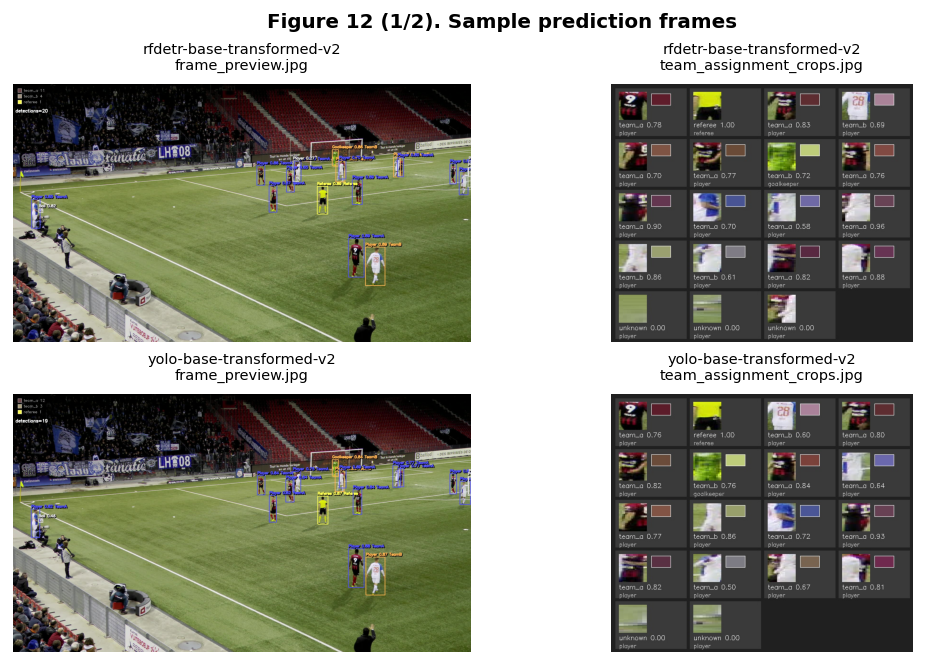

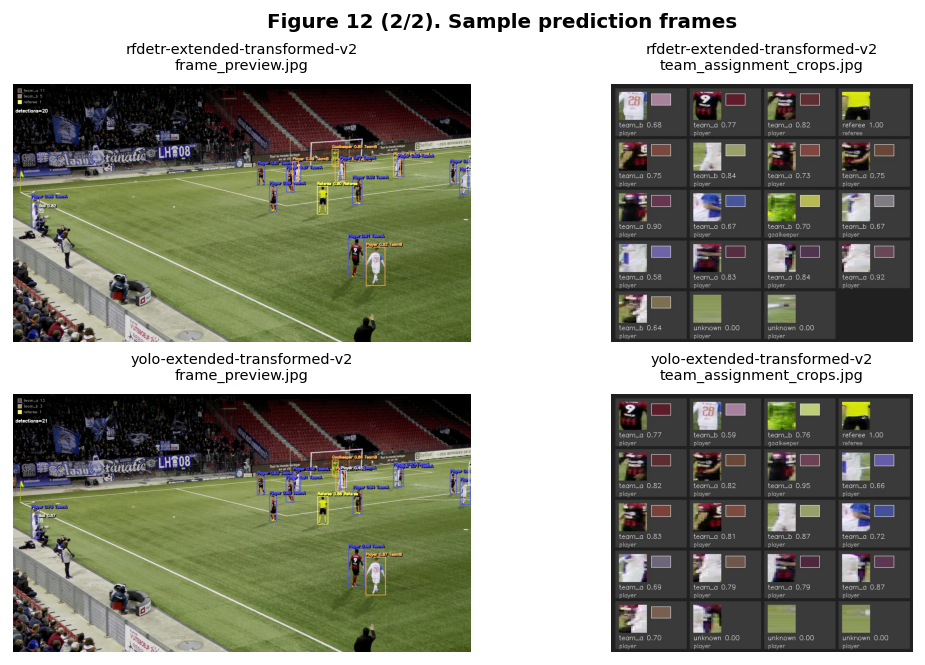

In [53]:
try:
    from PIL import Image
    PIL_AVAILABLE = True
except ImportError:
    PIL_AVAILABLE = False

PRED_ROOT = Path("../outputs/predictions")

def show_prediction_grid(run_names: list, max_per_run: int = 3, fig_label: str = "Figure 12. Sample prediction frames"):
    if not PIL_AVAILABLE:
        print("Pillow not available \u2014 install with: pip install Pillow")
        return

    collected = {}
    max_imgs_found = 0

    for run in run_names:
        run_dir = PRED_ROOT / run / "preview"
        if not run_dir.exists():
            print(f"Warning: Directory not found -> {run_dir}")
            collected[run] = []
            continue

        imgs = sorted(run_dir.glob("*.jpg"))[:max_per_run]
        if not imgs:
            imgs = sorted(run_dir.glob("*.png"))[:max_per_run]
        collected[run] = imgs
        max_imgs_found = max(max_imgs_found, len(imgs))

    if max_imgs_found == 0:
        print("No prediction images found. Check your paths.")
        return

    n_rows, n_cols = len(run_names), max_imgs_found
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 2.5 * n_rows),
                              constrained_layout=True)

    if n_rows == 1 and n_cols == 1:
        axes = [[axes]]
    elif n_rows == 1:
        axes = [axes]
    elif n_cols == 1:
        axes = [[ax] for ax in axes]

    for row_idx, run in enumerate(run_names):
        row_axes = axes[row_idx]
        imgs = collected.get(run, [])
        for ax, img_path in zip(row_axes, imgs):
            ax.imshow(Image.open(img_path))
            ax.set_title(f"{run}\n{img_path.name}", fontsize=8, pad=8)
            ax.axis("off")
        for ax in row_axes[len(imgs):]:
            ax.axis("off")

    fig.suptitle(fig_label, fontsize=11, weight="bold")
    plt.show()


def show_prediction_grid_split(run_names: list, max_per_run: int = 3, group_size: int = 2):
    """Render the prediction grid in smaller chunks (one figure per group of runs)
    so each rendered PNG stays small and GitHub can display the full notebook."""
    total = len(run_names)
    n_groups = (total + group_size - 1) // group_size
    for g in range(n_groups):
        chunk = run_names[g * group_size:(g + 1) * group_size]
        label = f"Figure 12 ({g + 1}/{n_groups}). Sample prediction frames"
        show_prediction_grid(chunk, max_per_run=max_per_run, fig_label=label)

show_prediction_grid_split([
    "rfdetr-base-transformed-v2",
    "yolo-base-transformed-v2",
    "rfdetr-extended-transformed-v2",
    "yolo-extended-transformed-v2",
], group_size=2)

These photos serve as an example of the models' performance. Next to each image there are displayed the found objects with the model's certainty.

## 9. Per-Class Detection Analysis

The aggregate metrics (mAP@0.5, F1) summarise performance across all four classes equally, but the classes are very different in size, appearance, and difficulty:

| Class | Approx. share | Why it's hard |
|-------|:---:|---|
| `player` | ~85% | Common, large, well-represented |
| `goalkeeper` | ~4% | Rare, visually similar to players, different jersey |
| `referee` | ~3% | Rare, distinct but small training signal |
| `ball` | ~8% | Very small (~20×20 px), often occluded or motion-blurred |

Everything in this section comes from `evaluate_per_class.py`, the same evaluator, same images, same confidence/IoU thresholds for both models, so YOLO and RF-DETR are shown side by side.

In [54]:
EVAL_RUNS = [
    "yolo-base-full-v2",
    "rfdetr-base-full-v2",
    "yolo-extended-full-v2",
    "rfdetr-extended-full-v2",
]

per_class_results = {}
missing = []

for run_name in EVAL_RUNS:
    result_path = META_ROOT / run_name / OUTPUT_FILENAME
    if result_path.exists():
        with open(result_path) as f:
            data = json.load(f)
        per_class_results[run_name] = data["per_class"]
        print(f"Loaded {run_name}  ({data['images_evaluated']} images, "
              f"iou={data['iou_threshold']}, conf={data['conf_threshold']})")
    else:
        missing.append(run_name)
        print(f"{run_name}  \u2014 not found")

Loaded yolo-base-full-v2  (142 images, iou=0.5, conf=0.25)
Loaded rfdetr-base-full-v2  (142 images, iou=0.5, conf=0.25)
Loaded yolo-extended-full-v2  (142 images, iou=0.5, conf=0.25)
Loaded rfdetr-extended-full-v2  (142 images, iou=0.5, conf=0.25)


In [55]:
if not per_class_results:
    print("No results loaded \u2014 run evaluate_per_class.py first.")
else:
    pc_rows = []
    for run_name, cls_metrics in per_class_results.items():
        model   = "YOLO" if "yolo" in run_name else "RF-DETR"
        variant = runs_data[run_name]["dataset_variant"]
        for cls in CLASSES:
            m = cls_metrics.get(cls, {})
            pc_rows.append({
                "Run":       run_name,
                "Model":     model,
                "Variant":   variant,
                "Class":     cls,
                "Precision": m.get("precision", 0),
                "Recall":    m.get("recall",    0),
                "F1":        m.get("f1",        0),
                "Support":   m.get("support",   0),
            })

    df_pc = pd.DataFrame(pc_rows)

    def _highlight_best_f1(df):
        styles = pd.DataFrame("", index=df.index, columns=df.columns)
        for cls in df["Class"].unique():
            for var in df["Variant"].unique():
                mask = (df["Class"] == cls) & (df["Variant"] == var)
                if mask.sum() == 0:
                    continue
                best = df.loc[mask, "F1"].idxmax()
                styles.loc[best, "F1"] = "font-weight: bold; background-color: #06402b"
        return styles

    display(df_pc.style
        .apply(_highlight_best_f1, axis=None)
        .format({"Precision": "{:.3f}", "Recall": "{:.3f}", "F1": "{:.3f}"})
        .set_caption(
            "Table 4. Per-class Precision, Recall, F1 @ IoU=0.5, shared evaluator. "
            "Bold = best F1 per class/variant pair."
        ))

,Run,Model,Variant,Class,Precision,Recall,F1,Support
0,yolo-base-full-v2,YOLO,base,player,0.940,0.969,0.954,1827
1,yolo-base-full-v2,YOLO,base,goalkeeper,0.986,0.932,0.958,74
2,yolo-base-full-v2,YOLO,base,referee,0.907,0.936,0.922,220
3,yolo-base-full-v2,YOLO,base,ball,0.624,0.593,0.608,140
4,rfdetr-base-full-v2,RF-DETR,base,player,0.980,0.991,0.986,1827
5,rfdetr-base-full-v2,RF-DETR,base,goalkeeper,0.960,0.973,0.966,74
6,rfdetr-base-full-v2,RF-DETR,base,referee,0.964,0.968,0.966,220
7,rfdetr-base-full-v2,RF-DETR,base,ball,0.780,0.686,0.730,140
8,yolo-extended-full-v2,YOLO,extended,player,0.963,0.970,0.966,1827
9,yolo-extended-full-v2,YOLO,extended,goalkeeper,0.899,0.959,0.928,74


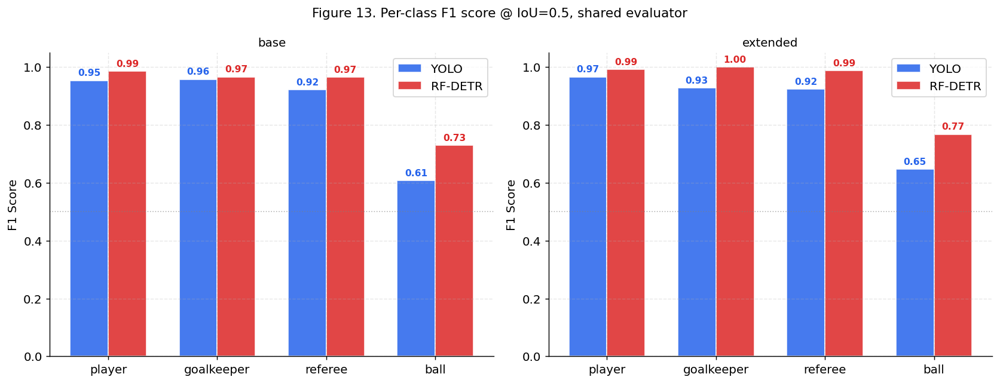

In [56]:
if not per_class_results:
    print("No results loaded \u2014 run evaluate_per_class.py first.")
else:
    fig, axes = plt.subplots(1, 2, figsize=(13, 5))

    for ax, var in zip(axes, ["base", "extended"]):
        x = np.arange(len(CLASSES))
        w = 0.35

        for i, (model_key, color, label) in enumerate([
            ("yolo",   YOLO_COLOR,   "YOLO"),
            ("rfdetr", RFDETR_COLOR, "RF-DETR"),
        ]):
            run_name = f"{model_key}-{var}-full-v2"
            cls_m    = per_class_results.get(run_name, {})
            values   = [cls_m.get(c, {}).get("f1", 0) for c in CLASSES]
            bars = ax.bar(x + i * w, values, w, label=label,
                          color=color, alpha=0.85, edgecolor="white")
            for bar, val in zip(bars, values):
                ax.text(bar.get_x() + bar.get_width() / 2,
                        bar.get_height() + 0.01,
                        f"{val:.2f}", ha="center", va="bottom",
                        fontsize=8.5, fontweight="bold", color=color)

        ax.set_xticks(x + w / 2)
        ax.set_xticklabels(CLASSES)
        ax.set_ylim(0, 1.05)
        ax.set_ylabel("F1 Score")
        ax.set_title(var, fontsize=11)
        ax.legend()
        ax.axhline(0.5, color="gray", linestyle=":", linewidth=0.9, alpha=0.6)

    plt.suptitle("Figure 13. Per-class F1 score @ IoU=0.5, shared evaluator", fontsize=12)
    plt.tight_layout()
    plt.show()

RF-DETR wins on every class for both variants, with the largest gap on `ball`, which is the smallest, hardest object in the dataset. This is consistent with the Weighted F1 results in Section 3.

## 10. Video Analysis

When run on a video file, the pipeline samples frames at a configurable FPS, runs detection on each, applies ByteTrack tracking, and saves an annotated `.mp4`. It also writes a `prediction_summary.json` with detection details for every sampled frame.

This section shows the source clip, then compares the certainty of both models on detecting the objects of this particular video.

### 10.1 The source clip

<video src="../data/videos/messi_real.mp4" controls width="640"></video>

*If the player above doesn't load (e.g. on GitHub's notebook preview for large files), the clip is at [`data/videos/messi_real.mp4`](../data/videos/messi_real.mp4).*

In [57]:
VIDEO_PATH = Path("../data/videos/messi_real.mp4")

if VIDEO_PATH.exists():
    display(Video(str(VIDEO_PATH), embed=True, width=640))
else:
    print(f"Video not found at {VIDEO_PATH}.")
    print("Set VIDEO_PATH above to your clip, or add a screenshot below for context:")
    SCREENSHOT_PATH = Path("../data/videos/messi_real_screenshot.png")
    if SCREENSHOT_PATH.exists():
        display(IPyImage(filename=str(SCREENSHOT_PATH)))
    else:
        print(f"(no screenshot found at {SCREENSHOT_PATH} either)")

### 10.2 Loading the prediction summaries

In [58]:
def load_latest_video_summary(run_name: str, pred_root: Path) -> dict | None:
    run_dir = pred_root / run_name
    if not run_dir.exists():
        return None
    candidates = sorted(run_dir.rglob("prediction_summary.json"),
                        key=lambda p: p.stat().st_mtime, reverse=True)
    for candidate in candidates:
        with open(candidate) as f:
            data = json.load(f)
        if data.get("mode") == "match" and data.get("status") == "ok":
            return data
    return None

VIDEO_PRED_ROOT = Path("../outputs/predictions")
VIDEO_RUNS = [
    "yolo-extended-full-v2",
    "rfdetr-extended-full-v2",
]

video_summaries = {
    run: load_latest_video_summary(run, VIDEO_PRED_ROOT)
    for run in VIDEO_RUNS
}

found = {k: v is not None for k, v in video_summaries.items()}
print("Video summaries found:", found)
if not any(found.values()):
    print()
    print("No video prediction summaries found.")
    print("Run predict.py with --mode match --input-path <video> to generate them.")
    print("See section 10.1 above for the exact commands.")

Video summaries found: {'yolo-extended-full-v2': True, 'rfdetr-extended-full-v2': True}


### 10.3 Overview

Annotated output videos for both models on the same clip:

**YOLO** (`yolo-extended-full-v2`)

<video src="../outputs/videos/yolomp4_h264.mp4" controls width="640"></video>

**RF-DETR** (`rfdetr-extended-full-v2`)

<video src="../outputs/videos/rfdetrmp4_h264.mp4" controls width="640"></video>

*If the players above appear empty, run the cell below once.*

In [59]:
ANNOTATED_VIDEOS = {
    "yolo-extended-full-v2":   Path("../outputs/videos/yolomp4.mp4"),
    "rfdetr-extended-full-v2": Path("../outputs/videos/rfdetrmp4.mp4"),
}


def display_playable_video(src_path: Path, width: int = 640):
    """Annotated videos are written with the mp4v codec, which most
    browsers cannot decode inside an HTML5 <video> tag (the player
    shows up but stays blank). Transcode to H.264 with ffmpeg first,
    cached alongside the source file, then display that instead.
    """
    if not src_path.exists():
        print(f"Video not found at {src_path}.")
        return

    if shutil.which("ffmpeg") is None:
        print(f"ffmpeg not found \u2014 cannot transcode {src_path.name} for playback.")
        print("Install ffmpeg, or open the file directly from outputs/videos/.")
        return

    h264_path = src_path.with_name(src_path.stem + "_h264.mp4")
    if not h264_path.exists() or h264_path.stat().st_mtime < src_path.stat().st_mtime:
        result = subprocess.run(
            ["ffmpeg", "-y", "-i", str(src_path),
             "-c:v", "libx264", "-pix_fmt", "yuv420p", "-movflags", "+faststart",
             str(h264_path)],
            capture_output=True, text=True,
        )
        if result.returncode != 0:
            print(f"ffmpeg transcoding failed for {src_path.name}:")
            print(result.stderr[-500:])
            return

    display(Video(str(h264_path), embed=True, width=width))


for run_name, video_path in ANNOTATED_VIDEOS.items():
    label = "YOLO" if "yolo" in run_name else "RF-DETR"
    print(f"{label} ({run_name}):")
    display_playable_video(video_path)


YOLO (yolo-extended-full-v2):


RF-DETR (rfdetr-extended-full-v2):


In [60]:
if not any(v is not None for v in video_summaries.values()):
    print("No video summaries available \u2014 skipping.")
else:
    overview_rows = []
    for run_name, summary in video_summaries.items():
        if summary is None:
            continue
        meta  = summary.get("video_metadata", {})
        stats = summary.get("stats", {})
        overview_rows.append({
            "Run":                run_name,
            "Model":              "YOLO" if "yolo" in run_name else "RF-DETR",
            "Sampled frames":     summary.get("sampled_frames", "?"),
            "Sample FPS":         summary.get("sample_fps", "?"),
            "Video duration (s)": meta.get("duration_seconds", "?"),
            "Total detections":   stats.get("total_detections", 0),
            "Mean confidence":    stats.get("mean_confidence", 0),
            "Track count":        stats.get("track_count", 0),
        })

    df_vid = pd.DataFrame(overview_rows)
    display(df_vid.style
        .format({"Mean confidence": "{:.3f}"})
        .set_caption("Table 5. Video analysis overview: both models on the same clip."))

,Run,Model,Sampled frames,Sample FPS,Video duration (s),Total detections,Mean confidence,Track count
0,yolo-extended-full-v2,YOLO,57,8,7.100000,459,0.658,22
1,rfdetr-extended-full-v2,RF-DETR,57,8,7.100000,494,0.769,31


### 10.4 Confidence distribution per class

Distribution of confidence scores each model assigns to its detections, per class, across the whole clip.

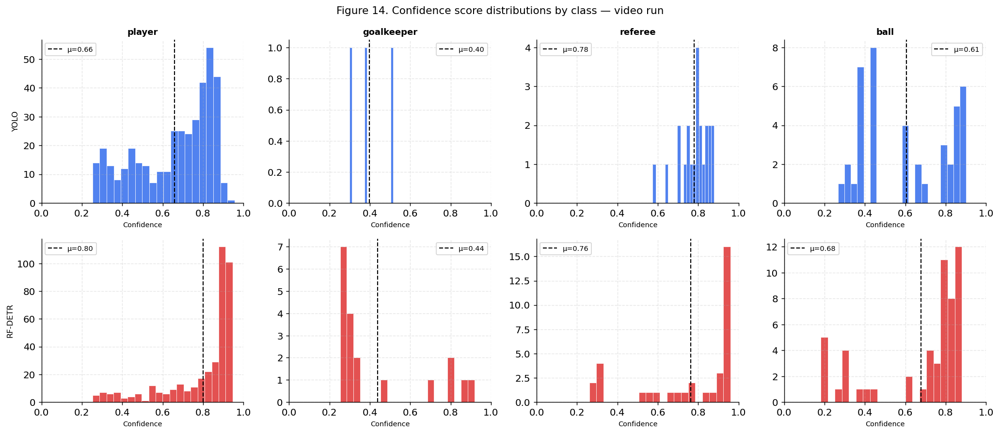

In [61]:
if not any(v is not None for v in video_summaries.values()):
    print("No video summaries available \u2014 skipping.")
else:
    CLASSES_VIDEO = ["player", "goalkeeper", "referee", "ball"]
    fig, axes = plt.subplots(2, 4, figsize=(16, 7))

    for row_idx, (run_name, summary) in enumerate(video_summaries.items()):
        if summary is None:
            continue
        color = YOLO_COLOR if "yolo" in run_name else RFDETR_COLOR
        label = "YOLO" if "yolo" in run_name else "RF-DETR"
        dets  = summary.get("detections", [])
        conf_by_cls = {c: [] for c in CLASSES_VIDEO}
        for det in dets:
            cls = det.get("class")
            if cls in conf_by_cls:
                conf_by_cls[cls].append(det.get("confidence", 0))

        for col_idx, cls in enumerate(CLASSES_VIDEO):
            ax   = axes[row_idx][col_idx]
            vals = conf_by_cls[cls]
            if vals:
                ax.hist(vals, bins=20, color=color, alpha=0.8, edgecolor="white", linewidth=0.5)
                ax.axvline(np.mean(vals), color="black", linestyle="--",
                           linewidth=1.2, label=f"\u03bc={np.mean(vals):.2f}")
                ax.legend(fontsize=8)
            else:
                ax.text(0.5, 0.5, "no detections", ha="center", va="center",
                        transform=ax.transAxes, color="gray", fontsize=9)
            if row_idx == 0:
                ax.set_title(cls, fontsize=10, fontweight="bold")
            if col_idx == 0:
                ax.set_ylabel(label, fontsize=9)
            ax.set_xlim(0, 1)
            ax.set_xlabel("Confidence", fontsize=8)

    plt.suptitle("Figure 14. Confidence score distributions by class \u2014 video run", fontsize=12)
    plt.tight_layout()
    plt.show()

For this particular clip, the histogram shapes are similar between models. The most certainty is when detecting the players and the referee, while the goalkeeper and the ball caused the most trouble. 

## 11. Conclusions

### 11.1 Answers to the research questions

**Q1. Which model achieves better detection quality?**

RF-DETR wins on the shared-evaluator metrics across the board. The gap is largest on `ball`, the smallest and hardest class in the dataset.

---

**Q2. How does the choice of training data affect each model?**

Both models gain substantially from the `extended` variant (+10–12 pp best-checkpoint mAP@0.5). RF-DETR is more data-responsive (+12.0 pp vs YOLO's +9.9 pp). Transforms have a near-neutral effect for both models. The single most impactful decision is adding the extended ball dataset, not adding transforms.

---

**Q3. How do training dynamics differ?**

| Aspect | YOLO | RF-DETR |
|--------|------|---------|
| Convergence | Gradual, steady | Fast rise, early plateau |
| Best epoch (base) | ~110/148 | ~24/100 |
| Post-peak wasted epochs | ~38 | ~76 |
| Stability | High | Moderate on small data |
| Gen. gap | Moderate | High on small data |

RF-DETR would benefit from an early-stop patience of ~20 epochs instead of a fixed 100.

---

**Q4. Which model is more practical?**

YOLO is significantly more practical: one adapter module vs four, automatic early stopping, built-in AMP, cleaner logs, faster inference.

### 11.2 Recommendation

- **RF-DETR (`rfdetr-extended-full-v2`)** achieves better detection quality on all four classes under fair evaluation. Prefer it when accuracy is the primary concern.

- **YOLO (`yolo-extended-full-v2`)** remains attractive for the production pipeline due to simpler integration, automatic early stopping, and faster inference. Per-class quality is lower but operationally it is much lower-friction.

- If the dataset grows substantially, RF-DETR's stronger data-scaling response makes it increasingly attractive.